In [ ]:
import os
import cv2 as cv
import glob as gb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import Model, layers, Sequential, optimizers
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow import keras
from tensorflow.keras import callbacks, layers, Model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
train_dir='/content/drive/MyDrive/New Plant Diseases Dataset(Augmented)/train'
valid_dir='/content/drive/MyDrive/New Plant Diseases Dataset(Augmented)/valid'
test_dir='/content/drive/MyDrive/New Plant Diseases Dataset(Augmented)/test'

In [ ]:
Size=224
X_test=[]
y_test=[]

# Data augmentation : rotation, translation, zoom,retournement horizontal,remise à l'échelle

In [ ]:
import tensorflow as tf
train_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=25,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    rescale=1/255.0,
).flow_from_directory(train_dir,batch_size=16,target_size=(Size,Size),subset="training",shuffle=True)


Found 70360 images belonging to 38 classes.


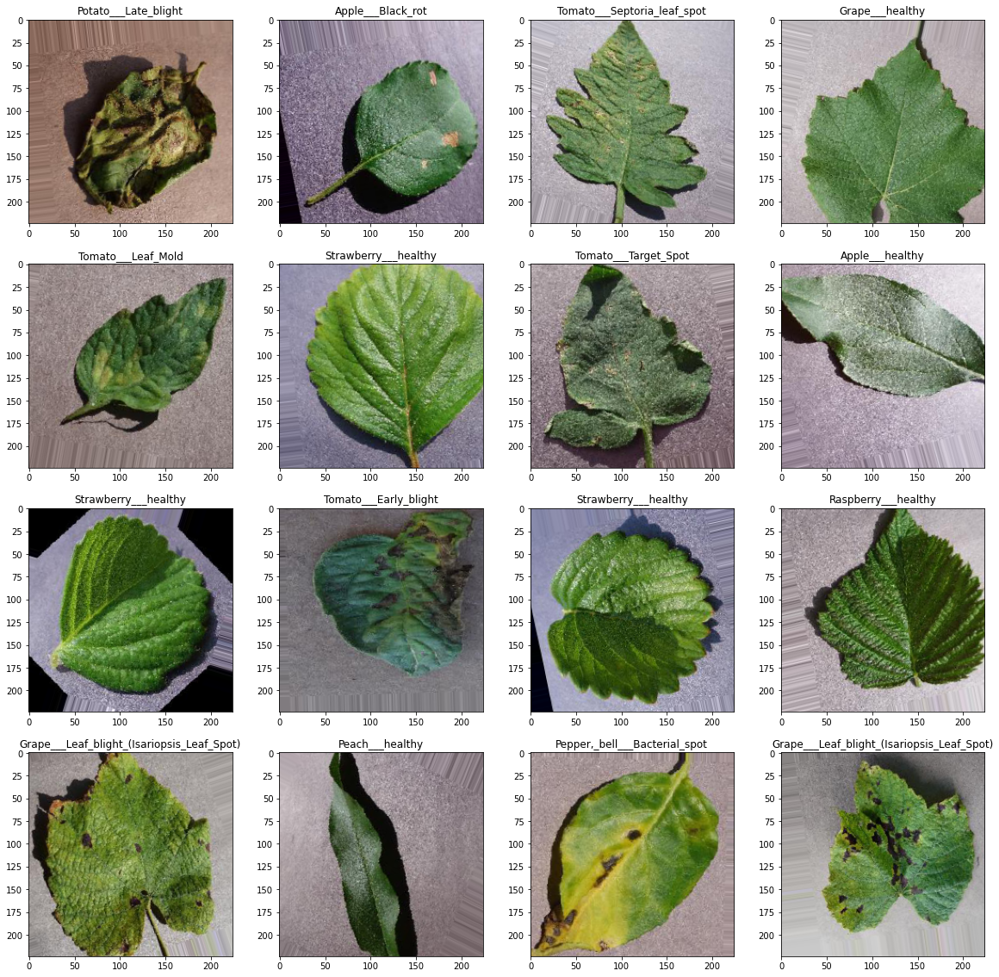

In [ ]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:

    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    # show the plot
    plt.show()
    break

In [ ]:
print(classes)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Sp

In [ ]:
valid_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
).flow_from_directory(valid_dir,batch_size=16,target_size=(Size,Size),shuffle=False)


Found 17572 images belonging to 38 classes.


In [ ]:
X_test=[]
for folder in os.listdir(test_dir):
    files=gb.glob(test_dir+'/*.JPG')
    for file in files :
        img=cv.imread(file)
        X_test.append(cv.resize(img,(Size,Size)))

In [ ]:
X_test=np.array(X_test)
print(X_test.shape)

(1089, 224, 224, 3)


In [ ]:
X_test=X_test/255.0

In [ ]:
import keras
from keras.layers import Flatten , Dense , Dropout , BatchNormalization , MaxPooling2D ,Conv2D
from keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping ,ReduceLROnPlateau ,ModelCheckpoint

#from keras.applications import vgg19

In [ ]:
EarlyStop=EarlyStopping(patience=10,restore_best_weights=True)
Reduce_LR=ReduceLROnPlateau(monitor='val_accuracy',verbose=2,factor=0.5,min_lr=0.00001)
model_check=ModelCheckpoint('model.keras',monitor='val_loss',verbose=1,save_best_only=True)
callback=[EarlyStop , Reduce_LR,model_check]

# AlexNet architecture

In [ ]:
alexnet=Sequential([
                Conv2D(96,11,activation='relu',strides=4,input_shape=(Size,Size,3)),
                BatchNormalization(),
                MaxPooling2D(3,strides=2),


                Conv2D(256,5,activation='relu',strides=1),
                MaxPooling2D(3,strides=2),

                Conv2D(384,3,activation='relu',strides=1),
                Conv2D(384,3,activation='relu',strides=1),
                Conv2D(256,3,activation='relu',strides=1),
                MaxPooling2D(3,strides=2),
                Flatten(),
                Dense(4096,activation='relu'),
                Dense(4096,activation='relu'),
                Dense(38,activation='softmax')
])

In [ ]:
alexnet.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
history=alexnet.fit(train_generator,validation_data=valid_generator,epochs=100,batch_size=32,
                  steps_per_epoch=len(train_generator)//16,validation_steps=len(valid_generator)//16,
                  callbacks=callback, verbose=1)

Epoch 1/100
274/274 [==============================] - ETA: 0s - loss: 3.5959 - accuracy: 0.0513
Epoch 00001: val_loss improved from inf to 3.62318, saving model to model.keras
274/274 [==============================] - 97s 354ms/step - loss: 3.5959 - accuracy: 0.0513 - val_loss: 3.6232 - val_accuracy: 0.0000e+00
Epoch 2/100
274/274 [==============================] - ETA: 0s - loss: 3.4847 - accuracy: 0.0643
Epoch 00002: val_loss did not improve from 3.62318
274/274 [==============================] - 88s 321ms/step - loss: 3.4847 - accuracy: 0.0643 - val_loss: 3.7313 - val_accuracy: 0.0000e+00
Epoch 3/100
274/274 [==============================] - ETA: 0s - loss: 3.3766 - accuracy: 0.0857
Epoch 00003: val_loss improved from 3.62318 to 3.29266, saving model to model.keras
274/274 [==============================] - 88s 323ms/step - loss: 3.3766 - accuracy: 0.0857 - val_loss: 3.2927 - val_accuracy: 0.0331
Epoch 4/100
274/274 [==============================] - ETA: 0s - loss: 3.1555 - accu

In [ ]:
ModelLoss, ModelAccuracy = alexnet.evaluate(valid_generator)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

1099/1099 [==============================] - 50s 46ms/step - loss: 0.6782 - accuracy: 0.7795
Test Loss is 0.678184986114502
Test Accuracy is 0.7794787287712097


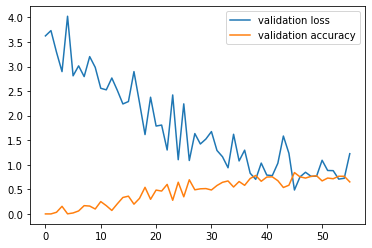

In [ ]:
plt.plot(history.history['val_loss'],label='validation loss')
plt.plot(history.history['val_accuracy'],label='validation accuracy')
plt.legend()

In [ ]:
alexnet_accuracy = history.history['val_accuracy'][len(history.history['val_accuracy'])-1]

Classification Report:
                                          precision    recall  f1-score   support

                      Apple___Apple_scab       0.00      0.00      0.00         3
                         Apple___healthy       0.00      0.00      0.00         0
Cherry_(including_sour)___Powdery_mildew       0.00      0.00      0.00         0
                   Potato___Early_blight       1.00      0.60      0.75         5
                        Potato___healthy       1.00      1.00      1.00         2
                 Squash___Powdery_mildew       0.00      0.00      0.00         0
                   Tomato___Early_blight       1.00      0.67      0.80         6
                    Tomato___Late_blight       0.00      0.00      0.00         0
                    Tomato___Target_Spot       0.00      0.00      0.00         0
                        Tomato___healthy       1.00      0.75      0.86         4

                                accuracy                           0.60  

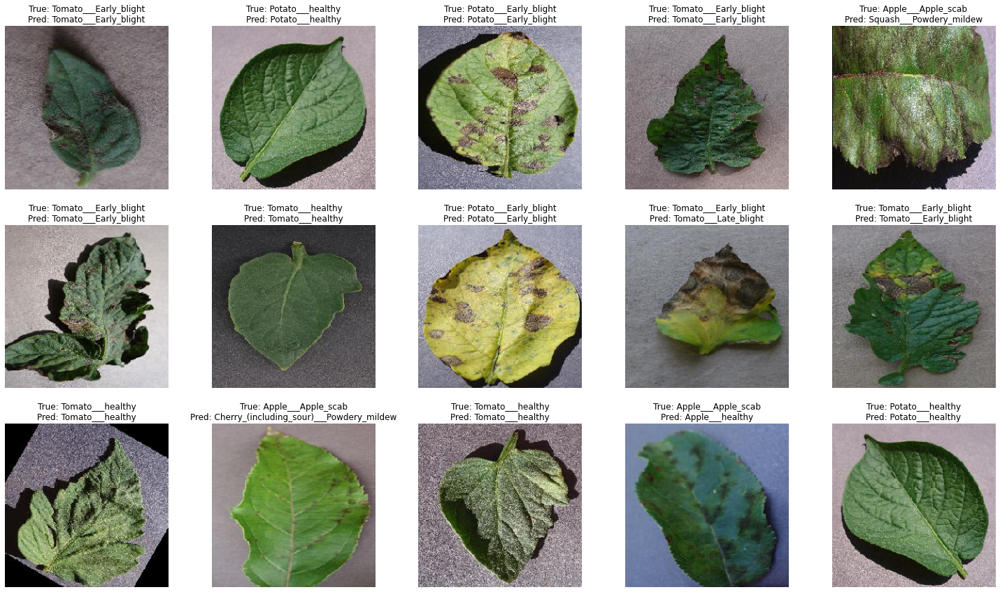

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

# Initialize lists for true and predicted labels
y_true = []
y_pred = []
images = []  # To store image data for visualization

# Iterate through the test directory to process images
for img_name in os.listdir(test_dir):
    # Load and preprocess the image
    img_path = os.path.join(test_dir, img_name)
    img = image.load_img(img_path, target_size=(224, 224))  # Adjust target_size to match your model's input size
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize the image array

    # Predict the class
    prediction = alexnet.predict(img_array)
    predicted_class = np.argmax(prediction, axis=1)[0]

    true_label_name = img_name.split('.')[0]  # Modify this if needed based on your naming convention
    true_label_name = true_label_name[:-1].lower()

    # Match true labels to predicted classes
    for label in classes:
        processed_label = label.replace('_', '').lower()
        if true_label_name in processed_label:
            y_true.append(classes.index(label))
            y_pred.append(predicted_class)
            images.append(img)  # Store the image for visualization
            break  # Exit the loop once the label is found

# Calculate unique classes
unique_classes = np.unique(y_true + y_pred).tolist()

# Calculate and print performance metrics
accuracy = np.mean(np.array(y_true) == np.array(y_pred))
report = classification_report(y_true, y_pred, target_names=[classes[i] for i in unique_classes])

print("Classification Report:")
print(report)

# Optional: Extract average precision, recall, and F1 score
report_dict = classification_report(y_true, y_pred, target_names=[classes[i] for i in unique_classes], output_dict=True)
macro_avg = report_dict['macro avg']

print(f"Accuracy          : {accuracy}")
print(f"Average Precision : {macro_avg['precision']}")
print(f"Average Recall    : {macro_avg['recall']}")
print(f"Average F1 Score  : {macro_avg['f1-score']}")

# Visualize images with actual and predicted labels
def plot_images(images, y_true, y_pred, classes, max_images=15):
    plt.figure(figsize=(20, 12))
    for i in range(min(max_images, len(images))):  # Limit to max_images
#         print(i)
        plt.subplot(3, 5, i + 1)
        plt.imshow(images[i])
        plt.title(f"True: {classes[y_true[i]]}\nPred: {classes[y_pred[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Call the function to plot images
plot_images(images, y_true, y_pred, classes)

# VGG19


In [ ]:
from keras.applications import VGG19

# Instantiate the VGG19 model
vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=(Size,Size,3))

vgg19.trainable = False



In [ ]:
# Define the layers
inputs = keras.Input(shape=(Size,Size,3))

# Get the layer
x = vgg19(inputs, training = False)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(4096, activation="relu")(x)
x = tf.keras.layers.Dense(4096, activation="relu")(x)

x = tf.keras.layers.Dense(38, activation="softmax")(x)

vgg19 = Model(inputs=inputs, outputs=x)

In [ ]:
vgg19.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
history=vgg19.fit(train_generator,validation_data=valid_generator,epochs=100,batch_size=32,
                  steps_per_epoch=len(train_generator)//16,validation_steps=len(valid_generator)//16,
                  callbacks=callback, verbose=1)

Epoch 1/100
274/274 [==============================] - ETA: 0s - loss: 2.9066 - accuracy: 0.3403
Epoch 00001: val_loss did not improve from 0.48662
274/274 [==============================] - 71s 258ms/step - loss: 2.9066 - accuracy: 0.3403 - val_loss: 2.1753 - val_accuracy: 0.4375
Epoch 2/100
274/274 [==============================] - ETA: 0s - loss: 1.2660 - accuracy: 0.5847
Epoch 00002: val_loss did not improve from 0.48662
274/274 [==============================] - 71s 259ms/step - loss: 1.2660 - accuracy: 0.5847 - val_loss: 1.1023 - val_accuracy: 0.6278
Epoch 3/100
274/274 [==============================] - ETA: 0s - loss: 1.0170 - accuracy: 0.6702
Epoch 00003: val_loss did not improve from 0.48662
274/274 [==============================] - 70s 254ms/step - loss: 1.0170 - accuracy: 0.6702 - val_loss: 1.1394 - val_accuracy: 0.5846
Epoch 4/100
274/274 [==============================] - ETA: 0s - loss: 0.8985 - accuracy: 0.7133
Epoch 00004: val_loss did not improve from 0.48662
274/27

In [ ]:
ModelLoss, ModelAccuracy = vgg19.evaluate(valid_generator)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

1099/1099 [==============================] - 89s 81ms/step - loss: 0.2756 - accuracy: 0.9077
Test Loss is 0.27555862069129944
Test Accuracy is 0.9076940417289734


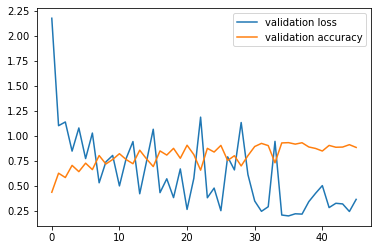

In [ ]:
plt.plot(history.history['val_loss'],label='validation loss')
plt.plot(history.history['val_accuracy'],label='validation accuracy')
plt.legend()

In [ ]:
vgg19_accuracy = history.history['val_accuracy'][len(history.history['val_accuracy'])-1]

Classification Report:
                                               precision    recall  f1-score   support

                           Apple___Apple_scab       1.00      1.00      1.00         3
                        Potato___Early_blight       1.00      1.00      1.00         5
                             Potato___healthy       1.00      1.00      1.00         2
                      Tomato___Bacterial_spot       0.00      0.00      0.00         0
                        Tomato___Early_blight       0.00      0.00      0.00         6
                         Tomato___Late_blight       0.00      0.00      0.00         0
Tomato___Spider_mites Two-spotted_spider_mite       0.00      0.00      0.00         0
                         Tomato___Target_Spot       0.00      0.00      0.00         0
                             Tomato___healthy       1.00      0.75      0.86         4

                                     accuracy                           0.65        20
                  

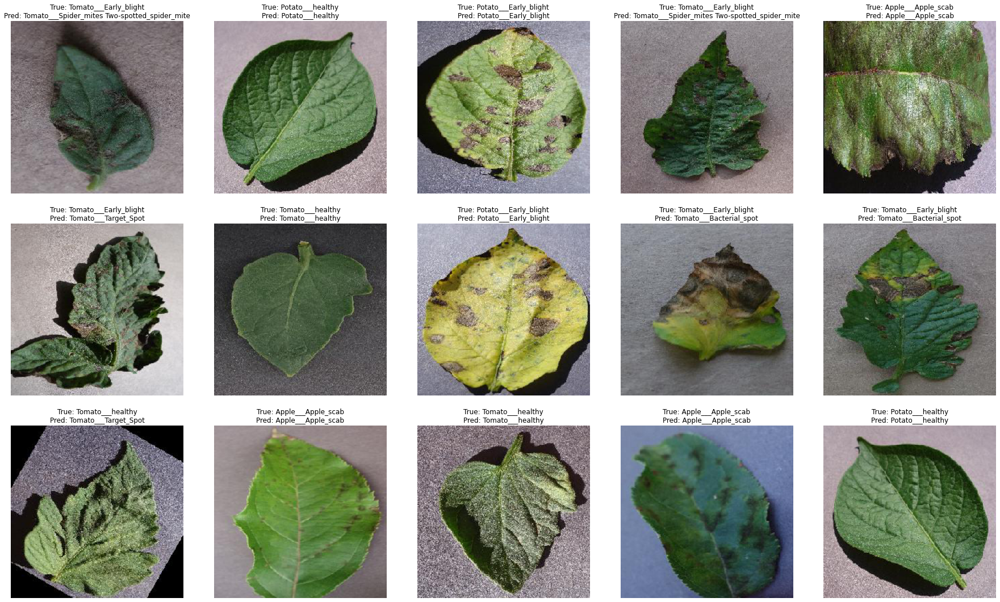

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

# Initialize lists for true and predicted labels
y_true = []
y_pred = []
images = []  # To store image data for visualization

# Iterate through the test directory to process images
for img_name in os.listdir(test_dir):
    # Load and preprocess the image
    img_path = os.path.join(test_dir, img_name)
    img = image.load_img(img_path, target_size=(224, 224))  # Adjust target_size to match your model's input size
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize the image array

    # Predict the class
    prediction = vgg19.predict(img_array)
    predicted_class = np.argmax(prediction, axis=1)[0]

    true_label_name = img_name.split('.')[0]  # Modify this if needed based on your naming convention
    true_label_name = true_label_name[:-1].lower()

    # Match true labels to predicted classes
    for label in classes:
        processed_label = label.replace('_', '').lower()
        if true_label_name in processed_label:
            y_true.append(classes.index(label))
            y_pred.append(predicted_class)
            images.append(img)  # Store the image for visualization
            break  # Exit the loop once the label is found

# Calculate unique classes
unique_classes = np.unique(y_true + y_pred).tolist()

# Calculate and print performance metrics
accuracy = np.mean(np.array(y_true) == np.array(y_pred))
report = classification_report(y_true, y_pred, target_names=[classes[i] for i in unique_classes])

print("Classification Report:")
print(report)

# Optional: Extract average precision, recall, and F1 score
report_dict = classification_report(y_true, y_pred, target_names=[classes[i] for i in unique_classes], output_dict=True)
macro_avg = report_dict['macro avg']

print(f"Accuracy          : {accuracy}")
print(f"Average Precision : {macro_avg['precision']}")
print(f"Average Recall    : {macro_avg['recall']}")
print(f"Average F1 Score  : {macro_avg['f1-score']}")

# Visualize images with actual and predicted labels
def plot_images(images, y_true, y_pred, classes, max_images=15):
    plt.figure(figsize=(25, 15))
    for i in range(min(max_images, len(images))):  # Limit to max_images
#         print(i)
        plt.subplot(3, 5, i + 1)
        plt.imshow(images[i])
        plt.title(f"True: {classes[y_true[i]]}\nPred: {classes[y_pred[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Call the function to plot images
plot_images(images, y_true, y_pred, classes)

# MobileNetV2

In [ ]:

mbnet_v2 = tf.keras.applications.MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(Size,Size,3)
)
mbnet_v2.trainable = False

9412608/9406464 [==============================] - 0s 0us/step


In [ ]:
# Define the layers
inputs = keras.Input(shape=(Size,Size,3))

# Get the layer
x = mbnet_v2(inputs, training = False)

# Stack layers further
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(4096, activation="relu")(x)
x = tf.keras.layers.Dense(4096, activation="relu")(x)

x = tf.keras.layers.Dense(38, activation="softmax")(x)


# Combine the model
mobilenet2 = Model(inputs=inputs, outputs=x)

# Summary
mobilenet2.summary()



Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
mobilenetv2_1.00_224 (Functi (None, 7, 7, 1280)        2257984   
_________________________________________________________________
flatten_2 (Flatten)          (None, 62720)             0         
_________________________________________________________________
dense_6 (Dense)              (None, 4096)              256905216 
_________________________________________________________________
dense_7 (Dense)              (None, 4096)              16781312  
_________________________________________________________________
dense_8 (Dense)              (None, 38)                155686    
Total params: 276,100,198
Trainable params: 273,842,214
Non-trainable params: 2,257,984
________________________________

In [ ]:
mobilenet2.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
history=mobilenet2.fit(train_generator,validation_data=valid_generator,epochs=100,batch_size=32,
                  steps_per_epoch=len(train_generator)//16,validation_steps=len(valid_generator)//16,
                  callbacks=callback, verbose=1)

Epoch 1/100
274/274 [==============================] - ETA: 0s - loss: 5.9018 - accuracy: 0.4843
Epoch 00001: val_loss did not improve from 0.29294
274/274 [==============================] - 60s 220ms/step - loss: 5.9018 - accuracy: 0.4843 - val_loss: 1.8033 - val_accuracy: 0.4678
Epoch 2/100
274/274 [==============================] - ETA: 0s - loss: 1.1255 - accuracy: 0.6941
Epoch 00002: val_loss did not improve from 0.29294
274/274 [==============================] - 59s 217ms/step - loss: 1.1255 - accuracy: 0.6941 - val_loss: 0.6494 - val_accuracy: 0.8199
Epoch 3/100
274/274 [==============================] - ETA: 0s - loss: 0.8012 - accuracy: 0.7641
Epoch 00003: val_loss did not improve from 0.29294
274/274 [==============================] - 60s 218ms/step - loss: 0.8012 - accuracy: 0.7641 - val_loss: 0.5803 - val_accuracy: 0.8300
Epoch 4/100
274/274 [==============================] - ETA: 0s - loss: 0.7114 - accuracy: 0.7972
Epoch 00004: val_loss did not improve from 0.29294
274/27

In [ ]:
ModelLoss, ModelAccuracy = mobilenet2.evaluate(valid_generator)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy))

1099/1099 [==============================] - 42s 38ms/step - loss: 0.4161 - accuracy: 0.8901
Test Loss is 0.41611775755882263
Test Accuracy is 0.8901092410087585


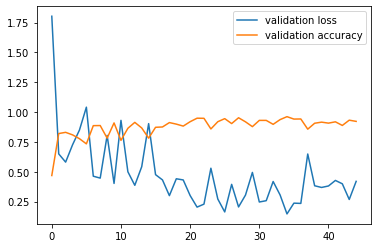

In [ ]:
plt.plot(history.history['val_loss'],label='validation loss')
plt.plot(history.history['val_accuracy'],label='validation accuracy')
plt.legend()

In [ ]:
mobilenetv2_accuracy = history.history['val_accuracy'][len(history.history['val_accuracy'])-1]

Classification Report:
                         precision    recall  f1-score   support

     Apple___Apple_scab       1.00      1.00      1.00         3
  Potato___Early_blight       1.00      0.60      0.75         5
   Potato___Late_blight       0.00      0.00      0.00         0
       Potato___healthy       1.00      1.00      1.00         2
Tomato___Bacterial_spot       0.00      0.00      0.00         0
  Tomato___Early_blight       1.00      0.17      0.29         6
     Tomato___Leaf_Mold       0.00      0.00      0.00         0
   Tomato___Target_Spot       0.00      0.00      0.00         0
       Tomato___healthy       1.00      1.00      1.00         4

               accuracy                           0.65        20
              macro avg       0.56      0.42      0.45        20
           weighted avg       1.00      0.65      0.72        20

Accuracy          : 0.65
Average Precision : 0.5555555555555556
Average Recall    : 0.4185185185185185
Average F1 Score  : 0.4484

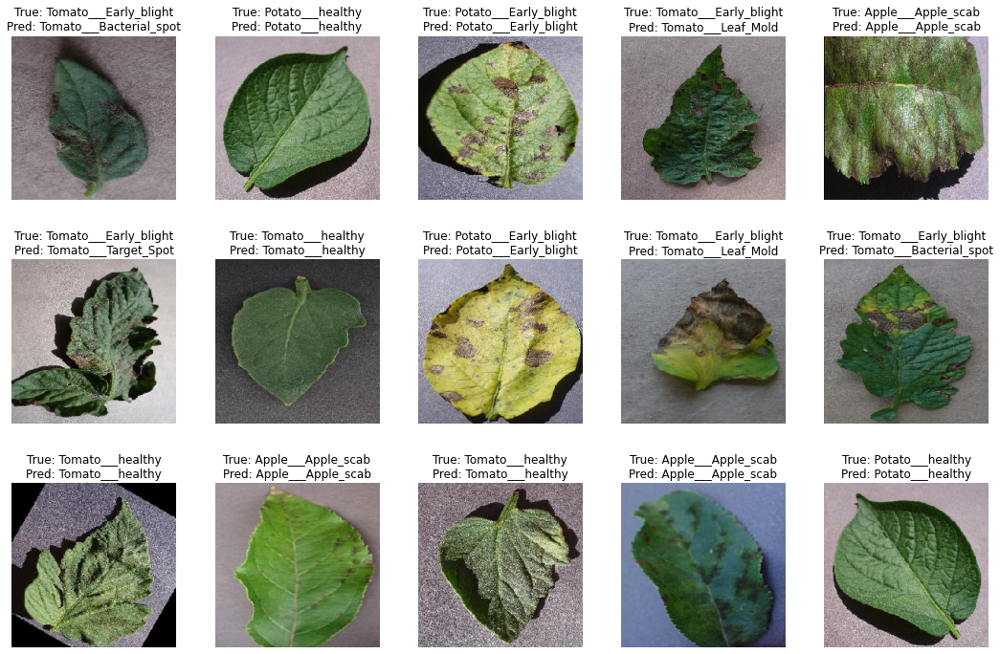

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

# Initialize lists for true and predicted labels
y_true = []
y_pred = []
images = []  # To store image data for visualization

# Iterate through the test directory to process images
for img_name in os.listdir(test_dir):
    # Load and preprocess the image
    img_path = os.path.join(test_dir, img_name)
    img = image.load_img(img_path, target_size=(224, 224))  # Adjust target_size to match your model's input size
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize the image array

    # Predict the class
    prediction = mobilenet2.predict(img_array)
    predicted_class = np.argmax(prediction, axis=1)[0]

    true_label_name = img_name.split('.')[0]  # Modify this if needed based on your naming convention
    true_label_name = true_label_name[:-1].lower()

    # Match true labels to predicted classes
    for label in classes:
        processed_label = label.replace('_', '').lower()
        if true_label_name in processed_label:
            y_true.append(classes.index(label))
            y_pred.append(predicted_class)
            images.append(img)  # Store the image for visualization
            break  # Exit the loop once the label is found

# Calculate unique classes
unique_classes = np.unique(y_true + y_pred).tolist()

# Calculate and print performance metrics
accuracy = np.mean(np.array(y_true) == np.array(y_pred))
report = classification_report(y_true, y_pred, target_names=[classes[i] for i in unique_classes])

print("Classification Report:")
print(report)

# Optional: Extract average precision, recall, and F1 score
report_dict = classification_report(y_true, y_pred, target_names=[classes[i] for i in unique_classes], output_dict=True)
macro_avg = report_dict['macro avg']

print(f"Accuracy          : {accuracy}")
print(f"Average Precision : {macro_avg['precision']}")
print(f"Average Recall    : {macro_avg['recall']}")
print(f"Average F1 Score  : {macro_avg['f1-score']}")

# Visualize images with actual and predicted labels
def plot_images(images, y_true, y_pred, classes, max_images=15):
    plt.figure(figsize=(15, 10))
    for i in range(min(max_images, len(images))):  # Limit to max_images
#         print(i)
        plt.subplot(3, 5, i + 1)
        plt.imshow(images[i])
        plt.title(f"True: {classes[y_true[i]]}\nPred: {classes[y_pred[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Call the function to plot images
plot_images(images, y_true, y_pred, classes)

# Inception model

In [ ]:
inception_model = InceptionV3(input_shape= (Size, Size, 3),
                                include_top = False,
                                weights = "imagenet")



for layer in inception_model.layers:
    layer.trainable = False


# Taking output from 'mixed8' layer
last_layer = inception_model.get_layer('mixed9')
print('Last Layer Output Shape:', last_layer.output_shape)
last_output = last_layer.output


x = layers.Flatten()(last_output)

x = layers.Dense(2048, activation='relu')(x)

x = layers.Dense(1024, activation='relu')(x)

x = layers.Dropout(0.2)(x)

x = layers.Dense(38, activation='softmax')(x)

inception3 = Model(inception_model.input, x)





87916544/87910968 [==============================] - 0s 0us/step
Last Layer Output Shape: (None, 5, 5, 2048)


In [ ]:
inception3.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
history=inception3.fit(train_generator,validation_data=valid_generator,epochs=100,batch_size=32,
                  steps_per_epoch=len(train_generator)//16,validation_steps=len(valid_generator)//16,
                  callbacks=callback, verbose=1)

Epoch 1/100
274/274 [==============================] - ETA: 0s - loss: 1.6590 - accuracy: 0.5935
Epoch 00001: val_loss did not improve from 0.14606
274/274 [==============================] - 61s 223ms/step - loss: 1.6590 - accuracy: 0.5935 - val_loss: 0.4988 - val_accuracy: 0.8529
Epoch 2/100
274/274 [==============================] - ETA: 0s - loss: 0.6898 - accuracy: 0.7790
Epoch 00002: val_loss did not improve from 0.14606
274/274 [==============================] - 60s 219ms/step - loss: 0.6898 - accuracy: 0.7790 - val_loss: 0.5184 - val_accuracy: 0.8327
Epoch 3/100
274/274 [==============================] - ETA: 0s - loss: 0.5936 - accuracy: 0.8166
Epoch 00003: val_loss did not improve from 0.14606
274/274 [==============================] - 60s 219ms/step - loss: 0.5936 - accuracy: 0.8166 - val_loss: 0.8784 - val_accuracy: 0.7298
Epoch 4/100
274/274 [==============================] - ETA: 0s - loss: 0.5073 - accuracy: 0.8481
Epoch 00004: val_loss did not improve from 0.14606
274/27

In [ ]:
ModelLoss, ModelAccuracy = inception3.evaluate(valid_generator)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy))

1099/1099 [==============================] - 44s 40ms/step - loss: 0.3258 - accuracy: 0.9073
Test Loss is 0.3258468210697174
Test Accuracy is 0.9072957038879395


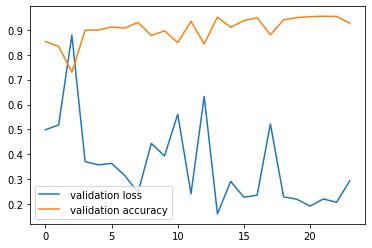

In [ ]:
plt.plot(history.history['val_loss'],label=' validation loss')
plt.plot(history.history['val_accuracy'],label=' validation accuracy')
plt.legend()

In [ ]:
inceptionv3_accuracy = history.history['val_accuracy'][len(history.history['val_accuracy'])-1]

Classification Report:
                             precision    recall  f1-score   support

         Apple___Apple_scab       1.00      1.00      1.00         3
      Potato___Early_blight       1.00      1.00      1.00         5
           Potato___healthy       1.00      1.00      1.00         2
    Tomato___Bacterial_spot       0.00      0.00      0.00         0
      Tomato___Early_blight       1.00      0.17      0.29         6
       Tomato___Late_blight       0.00      0.00      0.00         0
Tomato___Septoria_leaf_spot       0.00      0.00      0.00         0
       Tomato___Target_Spot       0.00      0.00      0.00         0
           Tomato___healthy       1.00      0.75      0.86         4

                   accuracy                           0.70        20
                  macro avg       0.56      0.44      0.46        20
               weighted avg       1.00      0.70      0.76        20

Accuracy          : 0.7
Average Precision : 0.5555555555555556
Average Recall

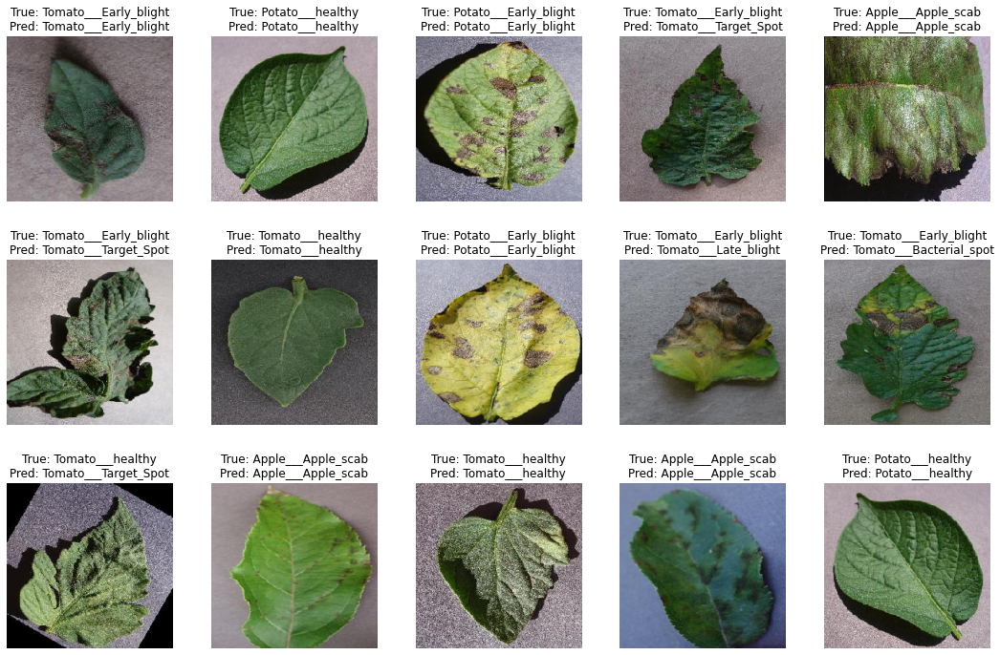

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

# Initialize lists for true and predicted labels
y_true = []
y_pred = []
images = []  # To store image data for visualization

# Iterate through the test directory to process images
for img_name in os.listdir(test_dir):
    # Load and preprocess the image
    img_path = os.path.join(test_dir, img_name)
    img = image.load_img(img_path, target_size=(224, 224))  # Adjust target_size to match your model's input size
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize the image array

    # Predict the class
    prediction = inception3.predict(img_array)
    predicted_class = np.argmax(prediction, axis=1)[0]

    true_label_name = img_name.split('.')[0]  # Modify this if needed based on your naming convention
    true_label_name = true_label_name[:-1].lower()

    # Match true labels to predicted classes
    for label in classes:
        processed_label = label.replace('_', '').lower()
        if true_label_name in processed_label:
            y_true.append(classes.index(label))
            y_pred.append(predicted_class)
            images.append(img)  # Store the image for visualization
            break  # Exit the loop once the label is found

# Calculate unique classes
unique_classes = np.unique(y_true + y_pred).tolist()

# Calculate and print performance metrics
accuracy = np.mean(np.array(y_true) == np.array(y_pred))
report = classification_report(y_true, y_pred, target_names=[classes[i] for i in unique_classes])

print("Classification Report:")
print(report)

# Optional: Extract average precision, recall, and F1 score
report_dict = classification_report(y_true, y_pred, target_names=[classes[i] for i in unique_classes], output_dict=True)
macro_avg = report_dict['macro avg']

print(f"Accuracy          : {accuracy}")
print(f"Average Precision : {macro_avg['precision']}")
print(f"Average Recall    : {macro_avg['recall']}")
print(f"Average F1 Score  : {macro_avg['f1-score']}")

# Visualize images with actual and predicted labels
def plot_images(images, y_true, y_pred, classes, max_images=15):
    plt.figure(figsize=(15, 10))
    for i in range(min(max_images, len(images))):  # Limit to max_images
#         print(i)
        plt.subplot(3, 5, i + 1)
        plt.imshow(images[i])
        plt.title(f"True: {classes[y_true[i]]}\nPred: {classes[y_pred[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Call the function to plot images
plot_images(images, y_true, y_pred, classes)

# Model selection

In [ ]:
models = ["alexnet","vgg19","mobilenetv2","inceptionv3"]
Models = [alexnet,vgg19,mobilenet2,inception3]

accuracies = [alexnet_accuracy,vgg19_accuracy,mobilenetv2_accuracy,inceptionv3_accuracy]

best_model_index = accuracies.index(max(accuracies))
print("best performing model :",models[best_model_index])
best_model_name = models[best_model_index]
best_model = Models[best_model_index]

best performing model : inceptionv3


# metrics applied on best model

In [ ]:
predictions=best_model.predict(valid_generator)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(valid_generator.classes, predictions.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.74      0.95      0.83       504
           1       0.95      0.97      0.96       497
           2       0.96      0.88      0.92       440
           3       0.92      0.95      0.94       502
           4       0.99      0.90      0.94       454
           5       1.00      0.76      0.87       421
           6       0.99      0.99      0.99       456
           7       0.89      0.89      0.89       410
           8       1.00      0.96      0.98       477
           9       0.90      0.90      0.90       477
          10       0.99      1.00      1.00       465
          11       0.89      0.99      0.93       472
          12       0.99      0.88      0.93       480
          13       0.99      0.99      0.99       430
          14       0.97      0.99      0.98       423
          15       1.00      0.88      0.93       503
          16       0.79      0.99      0.88       459
          17       0.99    

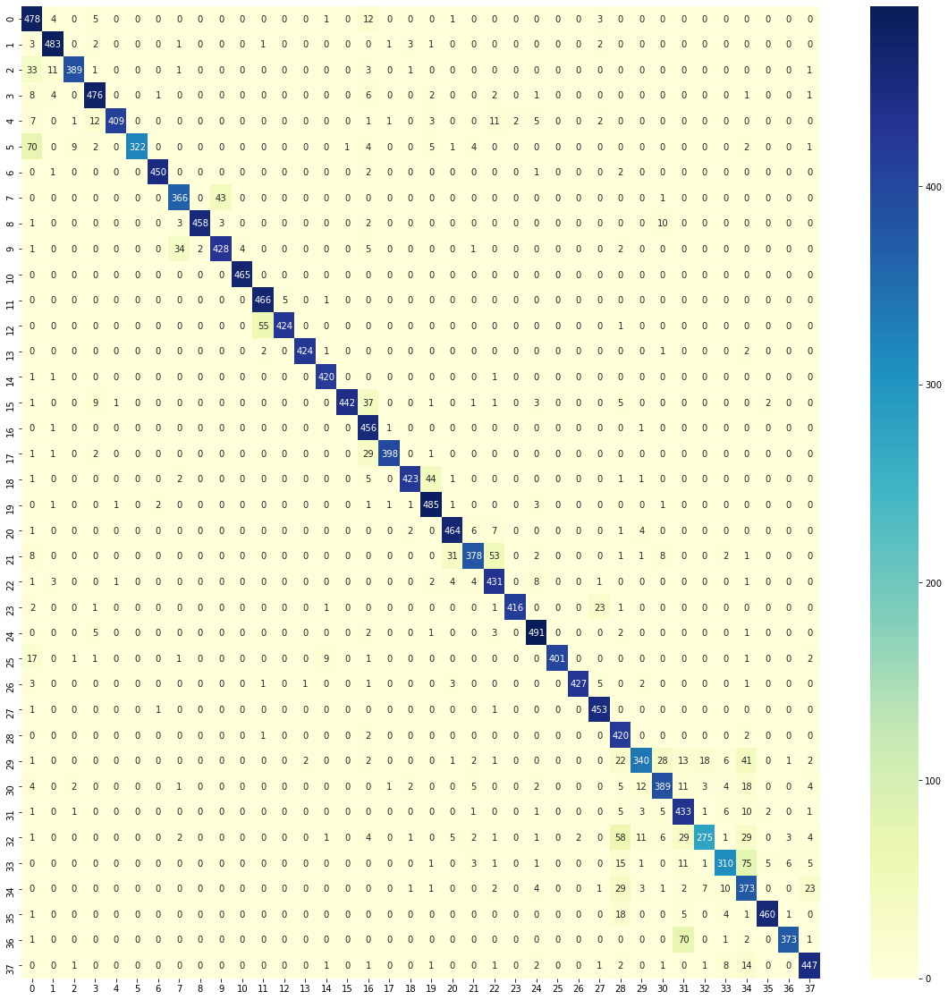

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(valid_generator.classes, predictions.argmax(axis=1))
plt.figure(figsize=(20,20))
sns.heatmap(cm,  annot=True, fmt="d" ,cmap="YlGnBu")

# Inference on new examples

test data are already resized, no additional preprocessing needed

In [ ]:
y_pred=best_model.predict(X_test)

In [ ]:
y_pred[0]

array([3.6466660e-04, 1.6229467e-07, 1.7708426e-06, 1.1910176e-06,
       1.2175467e-08, 3.5688981e-07, 1.6628610e-10, 1.4510526e-06,
       1.1093270e-08, 5.2518849e-06, 1.6175438e-08, 1.2337470e-06,
       5.8173332e-06, 1.3574771e-05, 3.7434969e-08, 1.1108717e-06,
       5.3037348e-07, 6.7135124e-09, 1.6460954e-06, 2.5003457e-08,
       5.5071760e-05, 8.6923259e-01, 2.0348685e-05, 9.7169888e-08,
       7.5733446e-08, 2.7815380e-08, 6.2108862e-05, 2.9966418e-07,
       3.2519307e-05, 7.8481667e-02, 4.8926070e-02, 2.1653008e-03,
       1.3339783e-04, 1.3421451e-04, 2.3919459e-04, 1.1444669e-04,
       3.6727126e-06, 1.7294903e-07], dtype=float32)

In [ ]:
predictions=y_pred.argmax(axis=1)

In [ ]:
classes

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_

In [ ]:
predictions

array([21, 35, 35, ...,  2, 20, 34])

In [ ]:
predictions[0]

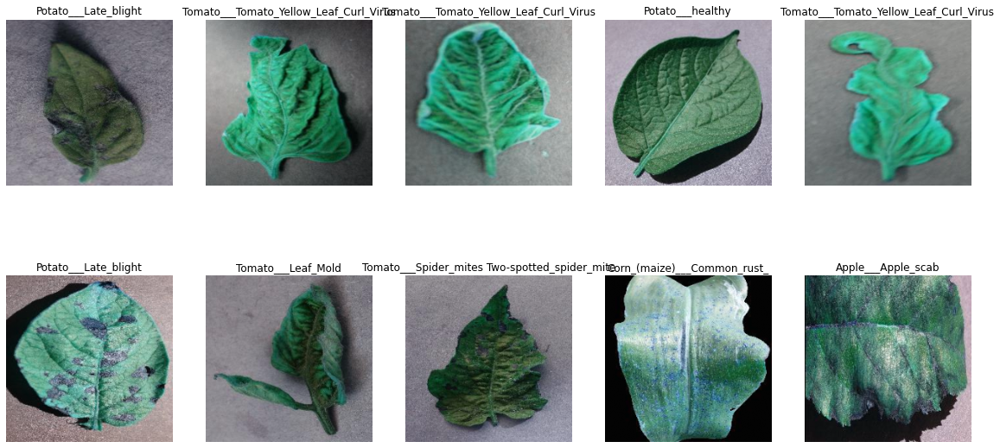

In [ ]:
import matplotlib.pyplot as plt

# Assuming X_test contains your test images, predictions contain your model predictions, and classes is a list of class names
plt.figure(figsize=(20, 10))

for i in range(10):
    plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns
    plt.imshow(X_test[i])
    plt.title(classes[predictions[i]])
    plt.axis('off')

plt.show()



# Save the model

In [ ]:
best_model.save("plant_disease_detection.h5")




In [ ]:
import json

from IPython.display import FileLink

# Link the files
FileLink("./plant_disease_detection.h5")

